# Importing The Libraries

In [1]:
import numpy as np
import pandas as pd


# Loading The Data

In [2]:
data = pd.read_csv("C:/Users/zeineb hadrich/Downloads/TuniziDataset.csv")

print(data.head())


   Unnamed: 0                               InputText  SentimentLabel
0           0                      7yeti ca ya slouma               1
1           1        rabi yehdik aka chenajmou n9oulo               1
2           2                      amazing like usual               1
3           3  bonne chance docteur marzouki vive cpr               1
4           4        allah yarhmou we rabi saber ahlo               1


# Data Pre-Processing

## Drop the SentimentLabel Column from the dataframe

In [3]:
data = data.drop(columns=['SentimentLabel'])
print(data.head())

   Unnamed: 0                               InputText
0           0                      7yeti ca ya slouma
1           1        rabi yehdik aka chenajmou n9oulo
2           2                      amazing like usual
3           3  bonne chance docteur marzouki vive cpr
4           4        allah yarhmou we rabi saber ahlo


## Check for missing values in each column

In [4]:
print(data.isnull().sum())

Unnamed: 0    0
InputText     0
dtype: int64


## Check for duplicate rows

In [5]:
print(data.duplicated().sum())

0


## Special Characters Treatement

### Function to check if the text contains special characters

In [6]:
import re

def contains_special_characters(text):

    # Define a regex pattern for special characters (anything that's not alphanumeric or space)

    return bool(re.search(r'[^a-zA-Z0-9\s]', text))

# Apply the function to the 'InputText' column and count rows with special characters

special_char_count = data[data['InputText'].apply(contains_special_characters)].shape[0]

print(f'Number of rows with special characters in InputText: {special_char_count}')

Number of rows with special characters in InputText: 10251


### Treatement of the 10K rows containing special characters

In [7]:
def extract_special_characters(text):

    return re.findall(r'[^a-zA-Z0-9\s]', text)



# Apply the function to extract special characters from rows with special characters

special_char_rows = data[data['InputText'].apply(contains_special_characters)]



# Extract all special characters from these rows

all_special_chars = special_char_rows['InputText'].apply(extract_special_characters)



# Flatten the list of special characters from all rows and get unique characters

flat_special_chars = [char for sublist in all_special_chars for char in sublist]

unique_special_chars = set(flat_special_chars)



# Print the unique special characters found

print("Unique special characters detected in the 10K rows:")

print(unique_special_chars)

Unique special characters detected in the 10K rows:
{'⅚', 'ç', 'à', 'ë', 'ã', 'ā', 'ǻ', 'ľ', 'ę', 'ị', '+', 'ô', 'á', 'ï', 'é', 'ê', 'ł', '_', '³', 'ß', 'ď', '١', 'ě', 'ē', 'ź', 'è', '⅝', 'ė', 'ă', 'ó', 'ÿ', 'đ', 'ĺ', 'ļ', 'ú', 'û', 'ù', 'ä', '٧', 'ệ', 'ý', 'â', 'ə', 'õ', 'æ', 'ǿ', '²', '.', 'į', 'ø', 'ò', 'ü', 'ı', '-', 'ő', 'ć', 'ö', 'í', 'î', '?', 'ŕ', "'", 'ȝ', '¹', 'ñ', '\ufeff', 'ĕ', 'œ', 'å', 'ì', 'ş', '٣', 'ķ'}


### Replacing Special Characters With Their Base Equivalents


In [8]:
# Define the character mapping for normalization (accented characters to unaccented)

char_mapping = {

    'ệ': 'e', 'à': 'a', 'ď': 'd', 'ę': 'e', 'ŕ': 'r', 'õ': 'o', 'ź': 'z',

    'ě': 'e', 'é': 'e', 'œ': 'o', 'į': 'i', 'ó': 'o', 'ô': 'o', 'ļ': 'l',

    'ă': 'a', '٧': '7', 'ò': 'o', 'ã': 'a', 'ø': 'o', 'ĕ': 'e', "'": '',

    'ė': 'e', 'ö': 'o', '²': '', 'í': 'i', 'î': 'i', 'ć': 'c', 'ị': 'i',

    'ş': 's', 'ê': 'e', 'ý': 'y', 'ï': 'i', 'ȝ': 'g', 'á': 'a', 'ç': 'c',

    'û': 'u', 'ì': 'i', 'ā': 'a', 'đ': 'd', '+': '', 'â': 'a', 'ǻ': 'a',

    'ñ': 'n', '١': '1', '٣': '3', 'ə': 'e', 'è': 'e', 'ő': 'o', 'ú': 'u',

    'ù': 'u', 'ķ': 'k', 'ł': 'l', 'å': 'a', 'ē': 'e', 'ǿ': 'o', 'ı': 'i',

    'ÿ': 'y', 'ë': 'e', '⅝': '', '؟': '?', '-': '', 'ľ': 'l', 'æ': 'ae',

    '³': '', '⅚': '', 'ü': 'u', 'ä': 'a', 'ĺ': 'l', '¹': ''

}



# Function to normalize the text by replacing special characters with their base equivalents

def normalize_special_characters(text):

    for char, replacement in char_mapping.items():

        text = text.replace(char, replacement)

    return text



# Apply the normalization function to the rows with special characters

data_cleaned = special_char_rows.copy()  # Keep only the rows with special characters



# Apply the normalization function to the 'InputText' column

data_cleaned['normalized_InputText'] = data_cleaned['InputText'].apply(normalize_special_characters)



# Check the cleaned data

print(data_cleaned[['InputText', 'normalized_InputText']].head(20))



# Optionally save the cleaned data

# data_cleaned.to_csv('normalized_special_characters_data.csv', index=False)


                                             InputText  \
27   ay 7aja fi masla7et tounes mara7béé biha ya sl...   
33   bras omek ya slayem ana akther wa7ed y7eb l cl...   
61                    héya li tzahina héya li 7abinéha   
64               kol aam w enti b khir mr le président   
79   9alo phénomène ya tunman slim eriahi milliarda...   
81   i like it 3aleeee5er 5dma bnina w dthaya3 j ai...   
135                          bel9odra lebess président   
141  e5dem ala rouhek w juste si slim na9es men bor...   
157                      bravo mahlehom les 2 épisodes   
161                                    hhhhhhhh blidàà   
165                                lefri9i 9éssét rjél   
174              big boss t notre président slim riahi   
196  gg ma lkit ma nkoul film fi calibre cinema khi...   
205  rabi ya7mik ya ja3far w y9awik 3ala fe3l el5ir...   
227  mehdi errais hajji med amine yassine hbibi 9al...   
238                              m3ak rabbi hé m3ellem   
251  béléhi or

### Update The DataFrame

In [9]:
# Step 1: Create a DataFrame excluding rows with special characters from the original dataset

data_no_special_chars = data[~data['InputText'].apply(contains_special_characters)]



# Step 2: Combine `data_no_special_chars` with `data_cleaned` (normalized data)

full_data = pd.concat([data_no_special_chars, data_cleaned[['normalized_InputText']]], axis=0)



# Step 3: Rename the 'normalized_InputText' column for consistency if needed

full_data['InputText'] = full_data['normalized_InputText'].fillna(full_data['InputText'])



# Step 4: Drop any temporary columns used for normalization

full_data = full_data[['InputText']]



# Assign `full_data` to `df`

df = full_data



# Check the length of `df` to ensure it includes all rows

print(f'Updated number of rows in df: {len(df)}')


Updated number of rows in df: 100000


In [10]:
df.head(20)

,InputText
0,7yeti ca ya slouma
1,rabi yehdik aka chenajmou n9oulo
2,amazing like usual
3,bonne chance docteur marzouki vive cpr
4,allah yarhmou we rabi saber ahlo
5,ma7lek ya slouma rabbi yfadhlek w ytawwel fi 3...
6,sanfour kan ganit wahdek 5yr
7,mabrok jam3ia
8,wahdek ya em3allem
9,machallah alikom rabbi ifadhalkom lbaadhkom


In [11]:
# Assuming your original DataFrame is named 'df' and contains a column named 'InputText'
filtered_df = df[df['InputText'].apply(lambda x: len(x.split()) <= 6)].copy()

# Display the first few rows and the length of the filtered DataFrame
print(filtered_df.head())
print(f"Number of rows in filtered_df: {len(filtered_df)}")


                                InputText
0                      7yeti ca ya slouma
1        rabi yehdik aka chenajmou n9oulo
2                      amazing like usual
3  bonne chance docteur marzouki vive cpr
4        allah yarhmou we rabi saber ahlo
Number of rows in filtered_df: 53366


In [12]:
import pandas as pd

# Initialize lists for input sequences and output words
filtered_inputs = []
filtered_outputs = []

# Iterate through each sentence in the filtered DataFrame
for sentence in filtered_df['InputText']:
    words = sentence.split()
    if len(words) <= 6:  # Include only sentences with a maximum of 6 words
        for i in range(2, len(words)):  # Start from the 3rd word
            input_sequence = " ".join(words[:i])  # First i words as input
            output_word = words[i]  # Next word as output
            filtered_inputs.append(input_sequence)
            filtered_outputs.append(output_word)

# Create a new DataFrame for input-output pairs
pairs_df = pd.DataFrame({
    'InputSequence': filtered_inputs,
    'OutputWord': filtered_outputs
})

# Display the first few rows and the total number of pairs
print(pairs_df.head())
print(f"Total input-output pairs created: {len(pairs_df)}")


               InputSequence OutputWord
0                   7yeti ca         ya
1                7yeti ca ya     slouma
2                rabi yehdik        aka
3            rabi yehdik aka  chenajmou
4  rabi yehdik aka chenajmou     n9oulo
Total input-output pairs created: 97076


In [13]:
pairs_df

,InputSequence,OutputWord
0,7yeti ca,ya
1,7yeti ca ya,slouma
2,rabi yehdik,aka
3,rabi yehdik aka,chenajmou
4,rabi yehdik aka chenajmou,n9oulo
...,...,...
97071,yousr stp,medilna
97072,yousr stp medilna,regime
97073,yousr stp medilna regime,mlih
97074,win wsilt,fil


Why Only a Decoder?
Autoregressive Nature:

The task is sequential word prediction, where the next word depends only on the preceding words.
Decoder-only transformers are designed for autoregressive tasks like this. They process the input sequence and predict the next token without needing an encoder.
Input and Output Relationship:

The input (InputSequence) is a short sequence of tokens (e.g., 2 words).
The output (OutputWord) is the next single token (e.g., the third word).
There’s no need to encode the input into a representation (which an encoder does), as the decoder itself is sufficient to capture the sequential dependencies.
Efficiency:

Using only a decoder reduces computational complexity compared to a full transformer (encoder-decoder). This is important given the dataset size and limited sequence length.
Self-Attention Suffices:

The decoder has masked self-attention, which allows it to focus on the preceding words in the sequence while ignoring future tokens.
This ensures predictions are based only on the current context, aligning perfectly with the requirements of this task.

## Tokenization

In [14]:
import tensorflow as tf
from tensorflow.keras.preprocessing.text import Tokenizer

# Create tokenizers
input_tokenizer = Tokenizer(oov_token="<OOV>")  # For InputSequence
output_tokenizer = Tokenizer()  # For OutputWord (no OOV)

# Fit tokenizers on the respective columns
input_tokenizer.fit_on_texts(pairs_df['InputSequence'])
output_tokenizer.fit_on_texts(pairs_df['OutputWord'])

# Convert InputSequence and OutputWord into sequences
input_sequences = input_tokenizer.texts_to_sequences(pairs_df['InputSequence'])
output_sequences = output_tokenizer.texts_to_sequences(pairs_df['OutputWord'])

# Print some examples for verification
print(f"Sample input sequences: {input_sequences[:5]}")
print(f"Sample output sequences: {output_sequences[:5]}")

# Vocabulary sizes
input_vocab_size = len(input_tokenizer.word_index) + 1  # Add 1 for padding
output_vocab_size = len(output_tokenizer.word_index) + 1  # Add 1 for padding

print(f"Input vocabulary size: {input_vocab_size}")
print(f"Output vocabulary size: {output_vocab_size}")


Sample input sequences: [[3571, 16], [3571, 16, 2], [3, 1598], [3, 1598, 429], [3, 1598, 429, 26064]]
Sample output sequences: [[1], [6], [544], [7719], [4407]]
Input vocabulary size: 36300
Output vocabulary size: 32323


## Padding

In [15]:
output_sequences[:5]
# Expected: [1, 6, 544, 7719, 4407]

[[1], [6], [544], [7719], [4407]]

In [16]:
# Flatten the list if it contains sublists
output_sequences = [seq[0] if isinstance(seq, list) else seq for seq in output_sequences]
output_sequences[:5]

[1, 6, 544, 7719, 4407]

In [17]:
from tensorflow.keras.preprocessing.sequence import pad_sequences
import numpy as np

# Use the correct max length based on your filtered dataset
max_length = 6  # Maximum length of sentences in your dataset

# Pad input sequences to ensure uniform length
padded_inputs = pad_sequences(input_sequences, maxlen=max_length, padding='post')

# Convert output sequences to a NumPy array and reshape
output_sequences = np.array(output_sequences)  # Convert to NumPy array
padded_outputs = output_sequences.reshape(-1, 1)  # Reshape for compatibility

print(f"Padded inputs shape: {padded_inputs.shape}")
print(f"Padded outputs shape: {padded_outputs.shape}")


Padded inputs shape: (97076, 6)
Padded outputs shape: (97076, 1)


# Transformer Architecture FROM SCRATCH

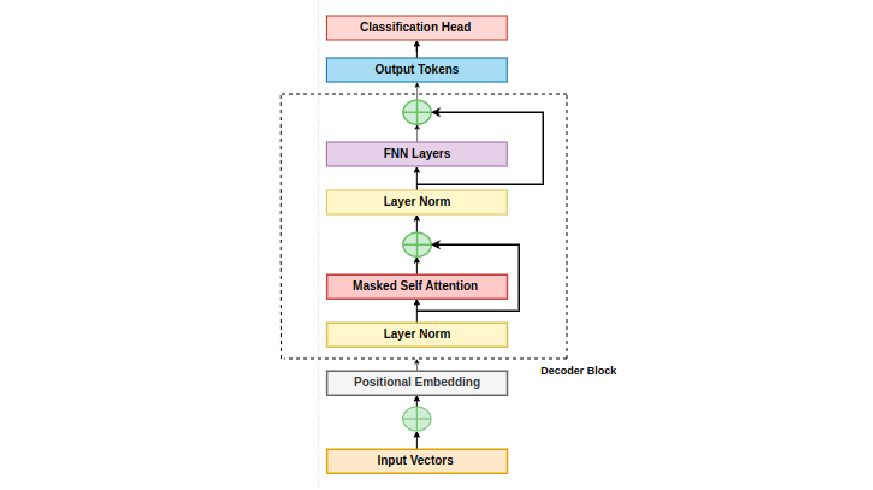

 **Given the focus on predicting the next word in Tunisian dialect,  the model is required to output the next word based on the preceding context.
A decoder-only architecture is optimized for this next-word prediction.**

## Decoder

### Embedding Layer

In [18]:
import tensorflow as tf

# Define embedding parameters
vocab_size = 36300  # From tokenization
embedding_dim = 128  # Desired size for the embedding vectors

# Create the embedding layer
embedding_layer = tf.keras.layers.Embedding(input_dim=vocab_size, output_dim=embedding_dim)

# Apply embedding to the padded inputs
embedded_inputs = embedding_layer(padded_inputs)  # Padded inputs are passed here

# Check the shape of the embedded inputs
print(f"Shape of embedded inputs: {embedded_inputs.shape}")


Shape of embedded inputs: (97076, 6, 128)


97076: Total number of sentences in the dataset .

6: The fixed maximum length of each sequence .

128: The dimensionality of the embedding vectors (each word token is represented by a 128-dimensional dense vector).

## Positional Encoding

Positional encoding is not needed for the output word, as it is a single token (a single word) that doesn't require position awareness.

In [19]:
import numpy as np
import tensorflow as tf

# Define positional encoding
def positional_encoding(max_seq_len, d_model):

    # Generate positions (0, 1, ..., max_seq_len-1)
    positions = np.arange(max_seq_len)[:, np.newaxis]
    # Generate dimensions (0, 1, ..., d_model-1)
    dimensions = np.arange(d_model)[np.newaxis, :]
    # Compute angles
    angle_rates = 1 / np.power(10000, (2 * (dimensions // 2)) / np.float32(d_model))
    angle_rads = positions * angle_rates

    # Apply sine to even indices and cosine to odd indices
    pos_encoding = np.zeros_like(angle_rads)
    pos_encoding[:, 0::2] = np.sin(angle_rads[:, 0::2])  # Sine for even indices
    pos_encoding[:, 1::2] = np.cos(angle_rads[:, 1::2])  # Cosine for odd indices

    # Add a batch dimension
    pos_encoding = pos_encoding[np.newaxis, ...]
    return tf.cast(pos_encoding, dtype=tf.float32)

# Generate positional encodings
max_seq_len = 6  # Based on the padded input length
d_model = 128  # Embedding dimension
pos_encodings = positional_encoding(max_seq_len, d_model)

print(f"Shape of positional encodings: {pos_encodings.shape}")


Shape of positional encodings: (1, 6, 128)


In [20]:
# Add positional encoding to embedded inputs
embedded_with_position = embedded_inputs + pos_encodings
print(f"Shape of input embeddings with positional encoding: {embedded_with_position.shape}")


Shape of input embeddings with positional encoding: (97076, 6, 128)


##  Decoder Block

## Stacking Multiple Decoder Blocks

In [21]:
import tensorflow as tf

def create_look_ahead_mask(batch_size, num_heads, seq_len):

    mask = tf.linalg.band_part(tf.ones((seq_len, seq_len)), -1, 0)  # Lower triangular matrix
    mask = 1 - mask  # Invert to create the look-ahead mask
    mask = tf.expand_dims(mask, axis=0)  # Add batch dimension
    mask = tf.expand_dims(mask, axis=0)  # Add head dimension
    mask = tf.tile(mask, [batch_size, num_heads, 1, 1])  # Repeat for batch size and num_heads
    return mask



In [22]:
import tensorflow as tf
from tensorflow.keras.layers import Layer

class DecoderLayer(tf.keras.layers.Layer):
    def __init__(self, embedding_dim, num_heads, hidden_dim, dropout_rate=0.1):
        super(DecoderLayer, self).__init__()
        self.mha = tf.keras.layers.MultiHeadAttention(num_heads=num_heads, key_dim=embedding_dim)
        self.ffn = tf.keras.Sequential([
            tf.keras.layers.Dense(hidden_dim, activation='relu'),
            tf.keras.layers.Dense(embedding_dim)
        ])
        self.layernorm1 = tf.keras.layers.LayerNormalization(epsilon=1e-6)
        self.layernorm2 = tf.keras.layers.LayerNormalization(epsilon=1e-6)
        self.dropout1 = tf.keras.layers.Dropout(dropout_rate)
        self.dropout2 = tf.keras.layers.Dropout(dropout_rate)

    def call(self, x, training, look_ahead_mask=None):
        # Self-attention with the provided look-ahead mask
        attn_output = self.mha(query=x, value=x, key=x, attention_mask=look_ahead_mask, training=training)
        attn_output = self.dropout1(attn_output, training=training)
        out1 = self.layernorm1(x + attn_output)  # Residual connection + normalization

        # Feed-forward network
        ffn_output = self.ffn(out1)
        ffn_output = self.dropout2(ffn_output, training=training)
        out2 = self.layernorm2(out1 + ffn_output)  # Residual connection + normalization

        return out2


class Decoder(tf.keras.layers.Layer):
    def __init__(self, vocab_size, embedding_dim, num_heads, hidden_dim, num_layers, max_seq_len, dropout_rate=0.1):
        super(Decoder, self).__init__()
        self.embedding = tf.keras.layers.Embedding(vocab_size, embedding_dim)
        self.positional_encoding = positional_encoding(max_seq_len, embedding_dim)
        self.dropout = tf.keras.layers.Dropout(dropout_rate)
        self.decoder_layers = [
            DecoderLayer(embedding_dim, num_heads, hidden_dim, dropout_rate) for _ in range(num_layers)
        ]
        self.final_layer = tf.keras.layers.Dense(vocab_size)
        self.num_heads = num_heads  # Store the number of attention heads

    def call(self, x, training, look_ahead_mask=None):
        # Add embeddings and positional encodings
        seq_len = tf.shape(x)[1]
        batch_size = tf.shape(x)[0]
        x = self.embedding(x) + self.positional_encoding[:, :seq_len, :]
        x = self.dropout(x, training=training)

        # Generate look-ahead mask if not provided
        if look_ahead_mask is None:
            look_ahead_mask = create_look_ahead_mask(batch_size, self.num_heads, seq_len)

        # Apply each decoder layer
        for layer in self.decoder_layers:
            x = layer(x, training=training, look_ahead_mask=look_ahead_mask)

        # Final linear layer to map to vocabulary size
        return self.final_layer(x)


# Testing the Decoder with dummy data
vocab_size = 36300  # Input vocabulary size
embedding_dim = 128
num_heads = 8
hidden_dim = 512
num_layers = 4
max_seq_len = 6
dropout_rate = 0.1

decoder = Decoder(vocab_size, embedding_dim, num_heads, hidden_dim, num_layers, max_seq_len, dropout_rate)

dummy_input = tf.random.uniform((64, max_seq_len), dtype=tf.int32, maxval=vocab_size)
look_ahead_mask = create_look_ahead_mask(batch_size=64, num_heads=8, seq_len=max_seq_len)

output = decoder(x=dummy_input, training=True, look_ahead_mask=look_ahead_mask)
print("Decoder output shape:", output.shape)


Decoder output shape: (64, 6, 36300)


# Split the dataset

In [23]:
from sklearn.model_selection import train_test_split

# Split the data
X_train, X_val, y_train, y_val = train_test_split(
    padded_inputs, padded_outputs, test_size=0.2, random_state=42
)




# Tensor flow datasets

In [24]:
# Prepare TensorFlow datasets
# Create train and validation datasets
batch_size = 32

train_dataset = tf.data.Dataset.from_tensor_slices((X_train, y_train))
train_dataset = train_dataset.shuffle(buffer_size=10000).batch(batch_size)

val_dataset = tf.data.Dataset.from_tensor_slices((X_val, y_val))
val_dataset = val_dataset.batch(batch_size)


# Loss function + Optimizer

In [25]:
import tensorflow as tf

# Define the loss function
loss_object = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True)

def loss_function(real, pred):
    scaled_pred = pred / 2.0  # Scale logits for better numerical stability
    return loss_object(real, scaled_pred)


# Define the optimizer
learning_rate = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=0.001,
    decay_steps=1000,
    decay_rate=0.9
)
optimizer = tf.keras.optimizers.Adam(learning_rate=0.01)

# Training metrics
train_loss = tf.keras.metrics.Mean(name='train_loss')


# Training Step Function

In [26]:
@tf.function
def train_step(input_seq, target_seq, decoder, optimizer):
    with tf.GradientTape() as tape:
        look_ahead_mask = create_look_ahead_mask(
            batch_size=tf.shape(input_seq)[0],
            num_heads=num_heads,
            seq_len=max_seq_len
        )
        predictions = decoder(input_seq, training=True, look_ahead_mask=look_ahead_mask)
        predictions = predictions[:, -1, :]  # Only take predictions for the final timestep
        target_seq = tf.reshape(target_seq, (-1,))
        loss = loss_function(target_seq, predictions)

        # Debugging with tf.print
        tf.print("Target Sequence:", target_seq[:5])
        tf.print("Predictions (logits):", predictions[:5])
        tf.print("Loss:", loss)

    gradients = tape.gradient(loss, decoder.trainable_variables)
    tf.print("Mean Gradient:", tf.reduce_mean([tf.reduce_mean(g) for g in gradients]))
    optimizer.apply_gradients(zip(gradients, decoder.trainable_variables))

    optimizer.apply_gradients(zip(gradients, decoder.trainable_variables))
    train_loss.update_state(loss)


In [27]:
for input_seq, target_seq in train_dataset.take(1):
    print(f"Input sequence shape: {input_seq.shape}")
    print(f"Target sequence shape: {target_seq.shape}")


Input sequence shape: (32, 6)
Target sequence shape: (32, 1)


# Test Train step

In [28]:
for input_seq, target_seq in train_dataset.take(1):
    train_step(input_seq, target_seq, decoder, optimizer)
print("Single train_step run successful!")


Target Sequence: [6 1 8929 22824 576]
Predictions (logits): [[0.0806546 -0.0694354475 0.034380056 ... 0.134060115 0.0404218175 0.0462270118]
 [0.054441154 0.0287207253 -0.0086835688 ... 0.0509699769 0.00926086213 0.0594848171]
 [0.174844489 0.0899714157 -0.101602256 ... 0.128110871 0.0339703225 -0.00833573844]
 [0.100036196 -0.0236608684 -0.0326644294 ... 0.115540668 0.0558116734 0.0693539679]
 [0.0985815302 -0.0313100256 -0.0839051306 ... 0.02837147 0.0825201 -0.0908368602]]
Loss: 10.5000973
Mean Gradient: -1.21751455e-07
Single train_step run successful!


In [29]:
import tensorflow as tf

# Define the training and validation loss metrics
train_loss = tf.keras.metrics.Mean(name="train_loss")
val_loss = tf.keras.metrics.Mean(name="val_loss")  # Add this line for validation loss


# Model Training

In [33]:
from tensorflow.keras.callbacks import EarlyStopping

# Early stopping
early_stopping = EarlyStopping(monitor="val_loss", patience=3, restore_best_weights=True)

# Define training and validation metrics
train_accuracy = tf.keras.metrics.SparseCategoricalAccuracy(name='train_accuracy')
val_accuracy = tf.keras.metrics.SparseCategoricalAccuracy(name='val_accuracy')

def compute_perplexity(loss):
    return tf.exp(loss)  # Perplexity is exp(loss)

epochs = 10  # Define the number of epochs
best_val_loss = float("inf")  # Initialize the best validation loss

for epoch in range(epochs):
    print(f"Epoch {epoch + 1}/{epochs}")
    train_loss.reset_state()
    val_loss.reset_state()

    # Training loop
    for batch, (input_seq, target_seq) in enumerate(train_dataset):
        train_step(input_seq, target_seq, decoder, optimizer)
        if batch % 100 == 0:
            print(f"Batch {batch}, Training Loss: {train_loss.result():.4f}")

    # Validation loop
    for input_seq, target_seq in val_dataset:
        look_ahead_mask = create_look_ahead_mask(
            batch_size=tf.shape(input_seq)[0],
            num_heads=num_heads,
            seq_len=max_seq_len
        )
        val_predictions = decoder(input_seq, training=False, look_ahead_mask=look_ahead_mask)
        val_predictions = val_predictions[:, -1,]   # Take predictions for the final timestep
        target_seq = tf.reshape(target_seq, (-1,))  # Flatten target
        val_loss.update_state(loss_function(target_seq, val_predictions))

    # Print metrics for the epoch
    print(f"Epoch {epoch + 1} Training Loss: {train_loss.result():.4f}, Validation Loss: {val_loss.result():.4f}")

print("Training complete!")

Epoch 1/10
Target Sequence: [11 1325 3 5 7]
Predictions (logits): [[-16.3637333 5.43544483 7.02322149 ... -16.4100075 -16.3848267 -16.4065895]
 [-16.3766136 5.29441643 6.912117 ... -16.4211788 -16.3964272 -16.4184265]
 [-16.3484802 5.26411724 6.91469383 ... -16.392643 -16.3678246 -16.39]
 [-16.3135319 5.44010878 7.01509619 ... -16.3594761 -16.3344212 -16.3560314]
 [-16.4705524 5.36032 6.72082376 ... -16.5118732 -16.4894085 -16.5112877]]
Loss: 8.68518639
Mean Gradient: -0.000299523788
Batch 0, Training Loss: 0.0000
Target Sequence: [1 14017 17578 5388 45]
Predictions (logits): [[-16.1671581 5.17907572 6.72438955 ... -16.2073135 -16.1825275 -16.2044296]
 [-16.2405567 5.05531454 6.66181183 ... -16.2800083 -16.255764 -16.2785492]
 [-16.2020626 5.13308811 6.70751143 ... -16.2423019 -16.2170715 -16.2399197]
 [-16.2107773 5.17082691 6.68051958 ... -16.2502861 -16.2258015 -16.248106]
 [-16.2273922 5.17518425 6.69419765 ... -16.2674828 -16.2433796 -16.2655144]]
Loss: 9.26164341
Mean Gradient: -

# Model Testing

In [34]:
# Define a sample input sentence
input_sentence = "alah yehdik"

# Preprocess the input
tokenized_input = input_tokenizer.texts_to_sequences([input_sentence])
padded_input = tf.keras.preprocessing.sequence.pad_sequences(
    tokenized_input, maxlen=max_seq_len, padding="post"
)
look_ahead_mask = create_look_ahead_mask(batch_size=1, num_heads=num_heads, seq_len=max_seq_len)

# Get predictions
predictions = decoder(padded_input, training=False, look_ahead_mask=look_ahead_mask)
predicted_word_index = tf.argmax(predictions[0, -1]).numpy()

# Decode and print the predicted word
predicted_word = output_tokenizer.index_word.get(predicted_word_index, "<UNK>")
print(f"Predicted next word: {predicted_word}")


Predicted next word: slim
